# Lattice Gas Cellular Automaton

In [ ]:
from simulation_functions.lattice_gas_functions import *

## Simulation
### Running the Simulation

In [2]:
L = 100  # size of the lattice
lattice = initialize_lattice(L)
snapshots = []
snapshots.append(lattice)
n_sweeps = 1500  # number of sweeps to perform
for i in range(n_sweeps):
    lattice = sweep(lattice)
    snapshots.append(lattice)

## Measurements

### Producing the Animation

In [3]:
from matplotlib import animation, rcParams
from IPython.display import HTML
from imageio_ffmpeg import get_ffmpeg_exe
rcParams['animation.ffmpeg_path'] = get_ffmpeg_exe()

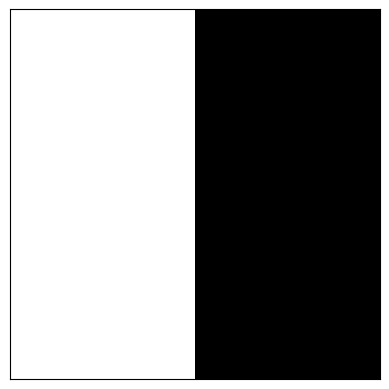

In [4]:
animation_frames = snapshots[::5]
fig, ax = plt.subplots()
im = ax.imshow(animation_frames[0], cmap='gray_r')
ax.set_xticks([])
ax.set_yticks([])
def update_frame(n):
    im.set_array(animation_frames[n])
    return im,

In [5]:
anim = animation.FuncAnimation(fig, func=update_frame, frames=len(animation_frames), interval=50, blit=True)
HTML(anim.to_jshtml())

### Image Compression as an Estimate for Entropy

In [ ]:
sizes = []
for snap in snapshots:
    compressed_lattice = gzip.compress(snap.tobytes())
    size = getsizeof(compressed_lattice)
    sizes.append(size)

Text(0, 0.5, 'Compressed Size (bytes)')

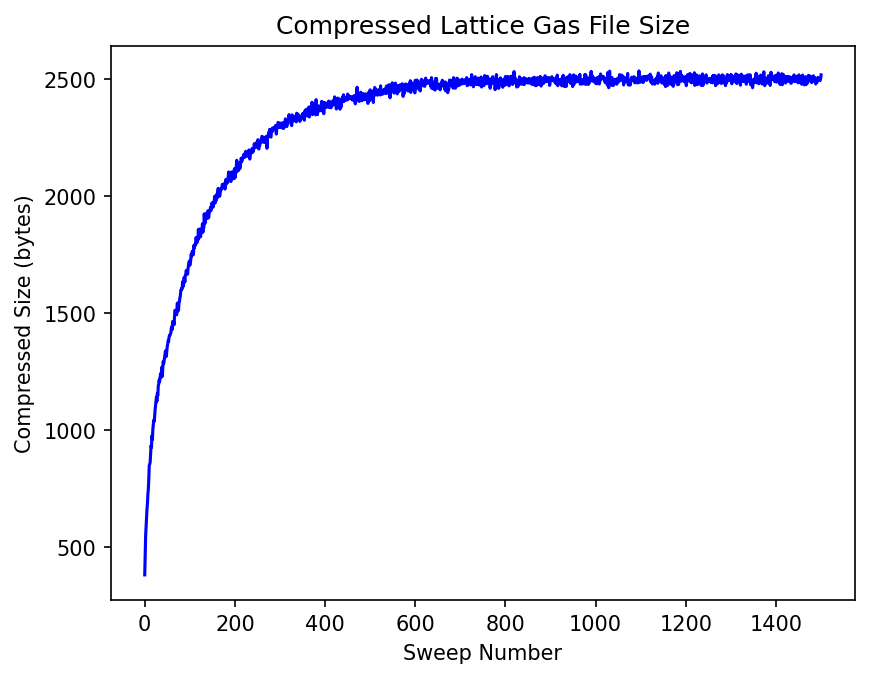

In [88]:
fig, ax = plt.subplots(dpi=150)
ax.plot(sizes, color='blue')
ax.set_title("Compressed Lattice Gas File Size")
ax.set_xlabel("Sweep Number")
ax.set_ylabel("Compressed Size (bytes)")

### Entropy of 1D Projection

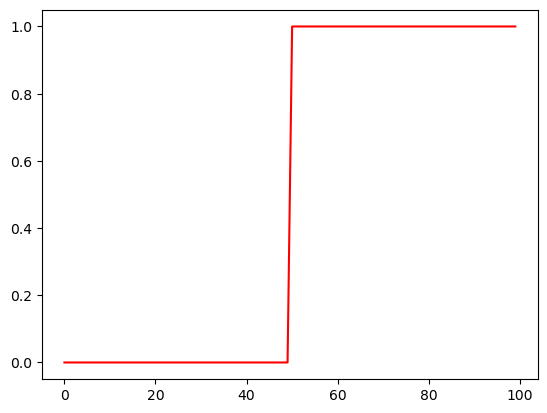

In [ ]:
fig, ax = plt.subplots()
x_density = np.mean(snapshots, axis=1)
dens_frames = x_density[::5]
dens_plot, = ax.plot(np.arange(100), dens_frames[0], color="red")
def update_dens(n):
    dens_plot.set_data(np.arange(100), dens_frames[n])
    return dens_plot,

In [90]:
dens_anim = animation.FuncAnimation(fig, func=update_dens, frames=len(dens_frames), interval=50, blit=True)
HTML(dens_anim.to_jshtml())

### Measuring the Entropy

In [84]:
from scipy.stats import entropy

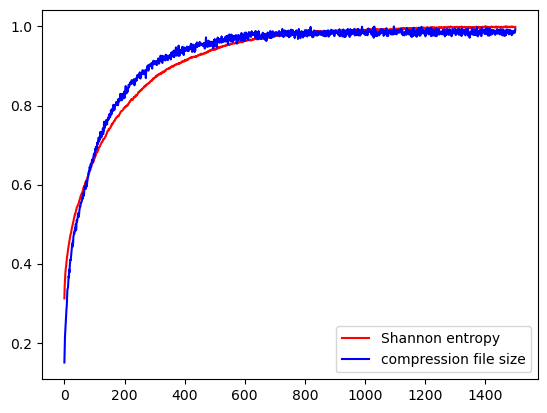

In [102]:
fig, ax = plt.subplots()
entropies = entropy(x_density, axis=1)
ax.plot(entropies - np.max(entropies) + 1, color="red", label="Shannon entropy")
ax.plot(sizes/np.max(sizes), color = "blue", label="compression file size")
ax.legend()